In [1]:
# use pymupdf to convert a PDF to a PNG images
import fitz  # PyMuPDF
import sys
import os

def pdf_to_png(pdf_path, output_folder):
    # Open the PDF file
    pdf_document = fitz.open(pdf_path)

    # Iterate over each page
    for page_number in range(len(pdf_document)):
        # Get the page
        page = pdf_document[page_number]

        # Render the page to an image (pixmap)
        pix = page.get_pixmap(dpi=300)

        # Save the image as a PNG file
        output_path = os.path.join(output_folder, f"page_{page_number + 1}.png")
        pix.save(output_path)

    # Close the PDF document
    pdf_document.close()

pdf_path = "../data/Gasc_symbols.pdf"
output_path = "./"
pdf_to_png(pdf_path, output_path)

Detected 1 shape(s)


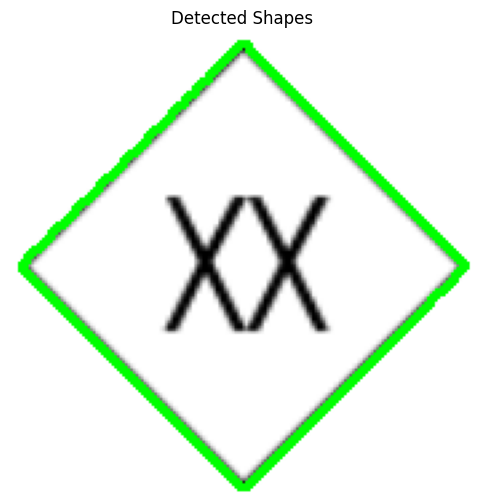

In [4]:
def detect_and_display_shapes(image_path, min_area=50):
    img = cv2.imread(image_path)
    orig = img.copy()

    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(gray, (1, 1), 0)

    # Use binary threshold instead of Canny for clean lines
    _, thresh = cv2.threshold(blur, 200, 255, cv2.THRESH_BINARY_INV)

    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    count = 0
    for cnt in contours:
        area = cv2.contourArea(cnt)
        if area < min_area:
            continue

        cv2.drawContours(img, [cnt], -1, (0, 255, 0), 2)
        count += 1

    print(f"Detected {count} shape(s)")
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(6,6))
    plt.imshow(img_rgb)
    plt.title("Detected Shapes")
    plt.axis("off")
    plt.show()

# Example usage
detect_and_display_shapes("./assembly.png")


In [9]:
def analyze_contour_scales(template_path, target_path, min_area=100):
    def get_contour_area_and_bbox(cnt):
        area = cv2.contourArea(cnt)
        x, y, w, h = cv2.boundingRect(cnt)
        return area, w, h, (x, y, w, h)

    # Extract main template contour
    template_cnt = extract_main_contour(template_path)
    if template_cnt is None:
        print("[ERROR] Template shape not found.")
        return

    t_area, t_w, t_h, _ = get_contour_area_and_bbox(template_cnt)
    t_aspect = t_w / t_h

    print(f"\n[Template]")
    print(f"- Area: {t_area:.1f}")
    print(f"- Width x Height: {t_w} x {t_h}")
    print(f"- Aspect Ratio: {t_aspect:.2f}")

    # Load and threshold target page
    img = cv2.imread(target_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    _, thresh = cv2.threshold(gray, 200, 255, cv2.THRESH_BINARY_INV)
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    print(f"\n[Target Page Shapes]")
    for i, cnt in enumerate(contours):
        if cnt is None or len(cnt) < 5:
            continue
        if cv2.contourArea(cnt) < min_area or not cv2.isContourConvex(cnt):
            continue
        a, w, h, (x, y, _, _) = get_contour_area_and_bbox(cnt)
        aspect = w / h
        area_ratio = a / t_area
        print(f"- ID #{i:02d}: Area={a:.1f}, Size={w}x{h}, Aspect={aspect:.2f}, Scale≈{(w/t_w):.2f}")


analyze_contour_scales("./assembly.png", "./page_3.png", min_area=100)

[ERROR] Template shape not found.


Template contour area: 13993.5
Detected 0 matching shape(s)


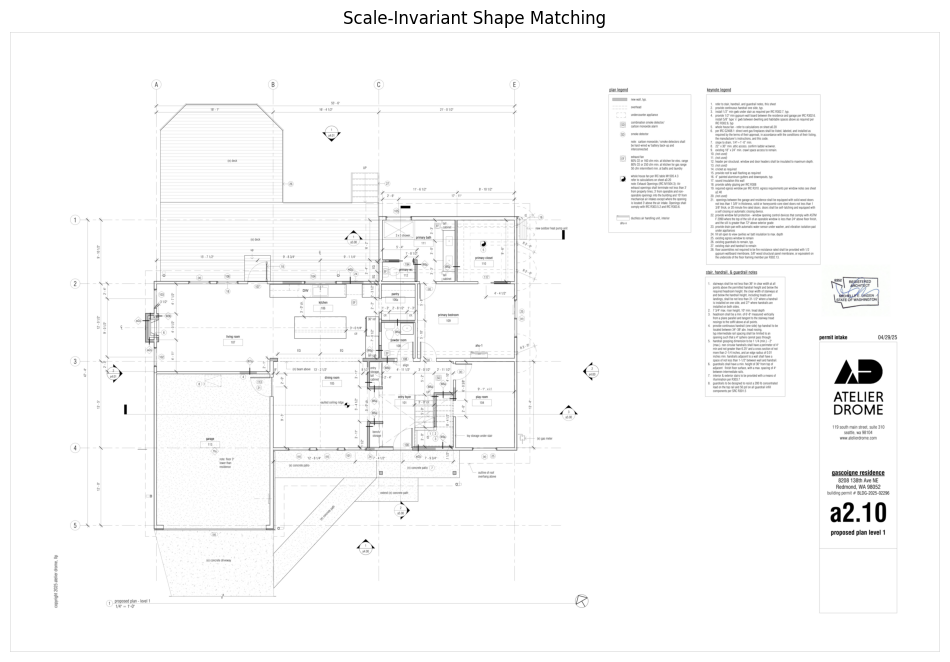

In [13]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def extract_main_contour(image_path):
    img = cv2.imread(image_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    _, thresh = cv2.threshold(gray, 200, 255, cv2.THRESH_BINARY_INV)
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    if not contours:
        return None
    
    return max(contours, key=cv2.contourArea)


def normalize_contour(cnt, scale=1.0):
    M = cv2.moments(cnt)
    if M["m00"] == 0:
        return cnt
    cx = int(M["m10"] / M["m00"])
    cy = int(M["m01"] / M["m00"])
    cnt_centered = cnt - [cx, cy]
    cnt_scaled = cnt_centered * scale
    cnt_scaled = cnt_scaled.astype(np.int32)
    return cnt_scaled

def detect_scaled_shapes(template_path, target_path, similarity_thresh=0.05, scales = [0.48, 0.50, 0.52, 0.54, 0.56, 0.58, 0.60]):
    template_cnt = extract_main_contour(template_path)
    print("Template contour area:", cv2.contourArea(template_cnt))
    target_img = cv2.imread(target_path)
    draw_img = target_img.copy()
    gray = cv2.cvtColor(target_img, cv2.COLOR_BGR2GRAY)
    _, thresh = cv2.threshold(gray, 200, 255, cv2.THRESH_BINARY_INV)
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    match_count = 0
    for target_cnt in contours:
        if cv2.contourArea(target_cnt) < 100 or not cv2.isContourConvex(target_cnt):
            continue
        for s in scales:
            scaled_template = normalize_contour(template_cnt, scale=s)
            score = cv2.matchShapes(scaled_template, target_cnt, cv2.CONTOURS_MATCH_I1, 0.0)
            if score < similarity_thresh:
                cv2.drawContours(draw_img, [target_cnt], -1, (0, 255, 0), 2)
                match_count += 1
                break  # prevent double-counting

    print(f"Detected {match_count} matching shape(s)")
    plt.figure(figsize=(12, 12))
    plt.imshow(cv2.cvtColor(draw_img, cv2.COLOR_BGR2RGB))
    plt.title("Scale-Invariant Shape Matching")
    plt.axis("off")
    plt.show()

# Run it
detect_scaled_shapes(
    template_path="./assembly.png",
    target_path="./page_3.png"
)


In [18]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def extract_main_contour(image_path):
    img = cv2.imread(image_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    _, thresh = cv2.threshold(gray, 200, 255, cv2.THRESH_BINARY_INV)
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if not contours:
        raise ValueError("No contours found in template image.")
    return max(contours, key=cv2.contourArea)

def normalize_contour(cnt, scale=1.0):
    M = cv2.moments(cnt)
    if M["m00"] == 0:
        return cnt
    cx = int(M["m10"] / M["m00"])
    cy = int(M["m01"] / M["m00"])
    cnt_centered = cnt - [cx, cy]
    cnt_scaled = cnt_centered * scale
    cnt_scaled = cnt_scaled.astype(np.int32)
    return cnt_scaled

def debug_scaled_template_overlay(
    template_path,
    target_path,
    scales=[0.05, 0.06, 0.07, 0.08, 0.09],
    centers=[(250, 820), (860, 383), (1850, 800)],
    figsize=(20, 14)
):
    template_cnt = extract_main_contour(template_path)
    target_img = cv2.imread(target_path)
    draw_img = target_img.copy()
    
    colors = [(255,0,0), (0,255,0), (0,0,255), (255,255,0), (255,0,255), (0,255,255)]
    
    for i, scale in enumerate(scales):
        scaled_template = normalize_contour(template_cnt, scale=scale)
        for cx, cy in centers:
            shifted = scaled_template + [cx, cy]
            cv2.drawContours(draw_img, [shifted], -1, colors[i % len(colors)], 2)

    plt.figure(figsize=figsize)
    dpi = 300
    h, w = draw_img.shape[:2]
    figsize = w / dpi, h / dpi
    plt.figure(figsize=figsize, dpi=dpi)
    plt.imshow(cv2.cvtColor(draw_img, cv2.COLOR_BGR2RGB))
    plt.axis("off")
    plt.tight_layout()
    plt.show()
    # plt.imshow(cv2.cvtColor(draw_img, cv2.COLOR_BGR2RGB))
    # plt.title("Scaled Template Overlay on Page")
    # plt.axis("off")
    # plt.show()


In [ ]:
debug_scaled_template_overlay(
    template_path="./assembly.png",
    target_path="./page_3.png",
    scales=[0.4, 0.45, 0.5, 0.55, 0.6],
    # centers=[(1000, 1000), (2000, 2000), (3000, 3000), (4200, 4200), (5000, 5000)]
    centers=[(4230, 4280)]
)


In [35]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def extract_main_contour(image_path):
    img = cv2.imread(image_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    _, thresh = cv2.threshold(gray, 200, 255, cv2.THRESH_BINARY_INV)
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if not contours:
        raise ValueError("No contours found in template image.")
    return max(contours, key=cv2.contourArea)

def normalize_contour(cnt, scale=1.0):
    M = cv2.moments(cnt)
    if M["m00"] == 0:
        return cnt
    cx = int(M["m10"] / M["m00"])
    cy = int(M["m01"] / M["m00"])
    cnt_centered = cnt - [cx, cy]
    cnt_scaled = cnt_centered * scale
    cnt_scaled = cnt_scaled.astype(np.int32)
    return cnt_scaled

def detect_scaled_shapes_verbose(
    template_path,
    target_path,
    similarity_thresh=0.06,
    scales=[0.4, 0.45, 0.5, 0.55, 0.6],
    size_range=(50, 150),  # (min, max) width/height in pixels
    aspect_range=(0.85, 1.15)
):
    template_cnt = extract_main_contour(template_path)
    target_img = cv2.imread(target_path)
    draw_img = target_img.copy()

    gray = cv2.cvtColor(target_img, cv2.COLOR_BGR2GRAY)
    _, thresh = cv2.threshold(gray, 200, 255, cv2.THRESH_BINARY_INV)
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    match_count = 0
    for idx, target_cnt in enumerate(contours):
        area = cv2.contourArea(target_cnt)
        if area < 100:
            print(f"⏭️  Skipping contour #{idx} (area too small: {area:.1f})")
            continue

        x, y, w, h = cv2.boundingRect(target_cnt)
        aspect = w / h
        if not (size_range[0] <= w <= size_range[1]) or not (size_range[0] <= h <= size_range[1]):
            print(f"⏭️  Skipping contour #{idx} (size {w}x{h} outside {size_range})")
            continue
        if not (aspect_range[0] <= aspect <= aspect_range[1]):
            print(f"⏭️  Skipping contour #{idx} (aspect ratio {aspect:.2f} outside {aspect_range})")
            continue

        print(f"🔍 Analyzing contour #{idx} (size: {w}x{h}, aspect: {aspect:.2f})")

        for s in scales:
            scaled_template = normalize_contour(template_cnt, scale=s)
            score = cv2.matchShapes(scaled_template, target_cnt, cv2.CONTOURS_MATCH_I3, 0.0)
            print(f"   - Scale {s:.2f}: Score = {score:.5f}")

            if score < similarity_thresh:
                print(f"✅ MATCH at scale {s:.2f} with score {score:.5f}")
                cv2.drawContours(draw_img, [target_cnt], -1, (0, 255, 0), 2)
                match_count += 1
                break  # stop after first good match

    print(f"\n✅ Total matches: {match_count}")
    out_path = "debug_matched_shapes.png"
    cv2.imwrite(out_path, draw_img)

    figsize=(20, 14)
    plt.figure(figsize=figsize)
    dpi = 300
    h, w = draw_img.shape[:2]
    figsize = w / dpi, h / dpi
    plt.figure(figsize=figsize, dpi=dpi)
    plt.imshow(cv2.cvtColor(draw_img, cv2.COLOR_BGR2RGB))
    plt.axis("off")
    plt.tight_layout()
    plt.show()


In [36]:
detect_scaled_shapes_verbose(
    template_path="./assembly.png",
    target_path="./page_3.png",
    similarity_thresh=0.06,
    scales=[0.4, 0.45, 0.5, 0.55, 0.6],
    size_range=(80, 120),
    aspect_range=(0.9, 1.1)
)


⏭️  Skipping contour #0 (size 10794x7197 outside (80, 120))

✅ Total matches: 0


<Figure size 2000x1400 with 0 Axes>

In [44]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def detect_diamonds_by_geometry(image_path, min_area=500, epsilon_ratio=0.02):
    img = cv2.imread(image_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Adaptive thresholding (more robust to lighting/texture)
    thresh = cv2.adaptiveThreshold(
        gray, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY_INV, 11, 2
    )

    # Morphological closing to bridge gaps in lines
    kernel = np.ones((3, 3), np.uint8)
    closed = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, kernel)

    # Extract contours
    contours, _ = cv2.findContours(closed, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    diamond_like = []
    for i, cnt in enumerate(contours):
        area = cv2.contourArea(cnt)
        if area < min_area:
            continue
        approx = cv2.approxPolyDP(cnt, epsilon_ratio * cv2.arcLength(cnt, True), True)
        if len(approx) == 4 and cv2.isContourConvex(approx):
            diamond_like.append(cnt)
            print(f"✅ Detected 4-point convex shape #{i} | Area: {area:.1f}")

    print(f"\nFound {len(diamond_like)} diamond-like shapes")
    result = img.copy()
    cv2.drawContours(result, diamond_like, -1, (0, 255, 0), 2)

    # Display full-resolution image (no blur)
    dpi = 300
    h, w = result.shape[:2]
    figsize = w / dpi, h / dpi
    plt.figure(figsize=figsize, dpi=dpi)
    plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
    plt.title("Diamond-Like Shapes Detected")
    plt.axis("off")
    plt.tight_layout()
    plt.show()

    return diamond_like

# Example usage
detect_diamonds_by_geometry("./page_3.png", min_area=500, epsilon_ratio=0.02)


✅ Detected 4-point convex shape #0 | Area: 77677221.0

Found 1 diamond-like shapes


[array([[[    3,     0]],
 
        [[    3,  7197]],
 
        [[10796,  7197]],
 
        [[10796,     0]]], dtype=int32)]

In [43]:
import cv2
import numpy as np

# Step 1: Load images
print("Loading images...")
template = cv2.imread('assembly.png')
source = cv2.imread('page_3.png')

# Step 2: Resize template
print("Resizing template...")
template_resized = cv2.resize(template, (94, 94))
cv2.imwrite('template_resized.png', template_resized)

# Step 3: Convert to grayscale
print("Converting to grayscale...")
template_gray = cv2.cvtColor(template_resized, cv2.COLOR_BGR2GRAY)
source_gray = cv2.cvtColor(source, cv2.COLOR_BGR2GRAY)
cv2.imwrite('template_gray.png', template_gray)

# Step 4: Create mask from template
print("Creating mask from template...")
_, binary = cv2.threshold(template_gray, 128, 255, cv2.THRESH_BINARY_INV)  # Inverse because outline is black
contours, _ = cv2.findContours(binary, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
if len(contours) > 0:
    # Find the contour with the largest area
    largest_contour = max(contours, key=cv2.contourArea)
    mask = np.zeros_like(template_gray)
    cv2.drawContours(mask, [largest_contour], -1, 255, thickness=1)
else:
    mask = np.zeros_like(template_gray)
cv2.imwrite('mask_from_template.png', mask)
print(f"Mask non-zero pixels: {cv2.countNonZero(mask)}")

# Step 5: Perform template matching
print("Performing template matching...")
result = cv2.matchTemplate(source_gray, template_gray, cv2.TM_CCORR_NORMED, mask=mask)

# Step 6: Find locations of matches with higher threshold
threshold = 0.95  # Increased from 0.8
print(f"Using threshold: {threshold}")
y, x = np.where(result >= threshold)
print(f"Found {len(x)} matches")

# Step 7: Draw rectangles around detected symbols
print("Drawing rectangles on detected symbols...")
for (xx, yy) in zip(x, y):
    cv2.rectangle(source, (xx, yy), (xx + 94, yy + 94), (0, 255, 0), 2)

# Step 8: Save output image
print("Saving output image...")
cv2.imwrite('output_with_matches.png', source)
print("Saved: output_with_matches.png")

print("Process complete. Check saved images for debugging.")

Loading images...
Resizing template...
Converting to grayscale...
Creating mask from template...
Mask non-zero pixels: 179
Performing template matching...
Using threshold: 0.95
Found 69845861 matches
Drawing rectangles on detected symbols...
Saving output image...
Saved: output_with_matches.png
Process complete. Check saved images for debugging.
